<a href="https://colab.research.google.com/github/apakle/MADS/blob/main/Milestone_1_Oral_Exam_Prep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import folium
from folium import plugins
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=False)
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive
#changing the working directory
%cd /content/gdrive/My Drive/Kaggle
#Check the present working directory using pwd command

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
Case = pd.read_csv("Case.csv")
PatientInfo = pd.read_csv('PatientInfo.csv')
Policy = pd.read_csv("Policy.csv")
Region = pd.read_csv('Region.csv')
SearchTrend = pd.read_csv("SearchTrend.csv")
SeoulFloating = pd.read_csv('SeoulFloating.csv')
Time = pd.read_csv("Time.csv")
TimeAge = pd.read_csv('TimeAge.csv')
TimeGender = pd.read_csv("TimeGender.csv")
TimeProvince = pd.read_csv('TimeProvince.csv')
Weather = pd.read_csv("Weather.csv")

In [ ]:
Case.head()

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
1,1000002,Seoul,Gwanak-gu,True,Richway,119,37.48208,126.901384
2,1000003,Seoul,Guro-gu,True,Guro-gu Call Center,95,37.508163,126.884387
3,1000004,Seoul,Yangcheon-gu,True,Yangcheon Table Tennis Club,43,37.546061,126.874209
4,1000005,Seoul,Dobong-gu,True,Day Care Center,43,37.679422,127.044374


# **Topic 1**: “Most prediction problems are causal reasoning problems in disguise”


## Spread by region

In [ ]:
# using the TimeProvince DF
df = TimeProvince.groupby('province').max().drop('time', axis=1)

# add death rate
df['death_rate'] = (df.deceased / df.confirmed)*100
df

,date,confirmed,released,deceased,death_rate
province,,,,,
Busan,2020-06-30,154,143,3,1.948052
Chungcheongbuk-do,2020-06-30,65,60,0,0.000000
Chungcheongnam-do,2020-06-30,167,150,0,0.000000
Daegu,2020-06-30,6906,6700,189,2.736751
Daejeon,2020-06-30,117,44,1,0.854701
Gangwon-do,2020-06-30,65,54,3,4.615385
Gwangju,2020-06-30,44,32,0,0.000000
Gyeonggi-do,2020-06-30,1207,931,23,1.905551
Gyeongsangbuk-do,2020-06-30,1389,1328,54,3.887689


In [ ]:
# using the PatientInfo DF
PatientInfo.groupby('province').count()[['confirmed_date','released_date','deceased_date']]


,confirmed_date,released_date,deceased_date
province,,,
Busan,151,0,0
Chungcheongbuk-do,56,50,0
Chungcheongnam-do,168,150,0
Daegu,137,4,20
Daejeon,119,44,1
Gangwon-do,63,28,3
Gwangju,44,26,0
Gyeonggi-do,1208,61,1
Gyeongsangbuk-do,1251,862,40


In [ ]:
Case.groupby('province').sum()['confirmed']

province
Busan                 156
Chungcheongbuk-do      60
Chungcheongnam-do     158
Daegu                6680
Daejeon               131
Gangwon-do             62
Gwangju                43
Gyeonggi-do          1000
Gyeongsangbuk-do     1324
Gyeongsangnam-do      132
Incheon               202
Jeju-do                19
Jeollabuk-do           23
Jeollanam-do           25
Sejong                 49
Seoul                1280
Ulsan                  51
Name: confirmed, dtype: int64

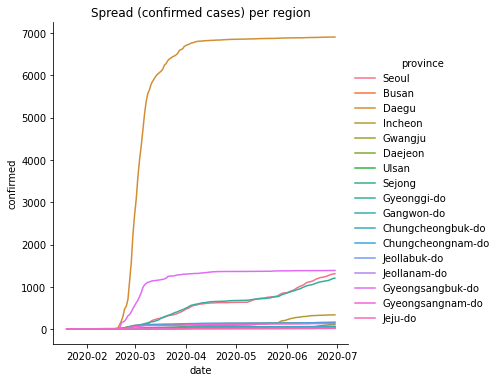

In [ ]:
# line plot for the different regions using the TimeProvince DF and the seaborn relplot function

# convert the date into datetime format (to get proper display of the x axis)
TimeProvince['date']=pd.to_datetime(TimeProvince.date)
sns.relplot(x='date',y='confirmed', hue='province', kind='line', data=TimeProvince)
plt.title('Spread (confirmed cases) per region');

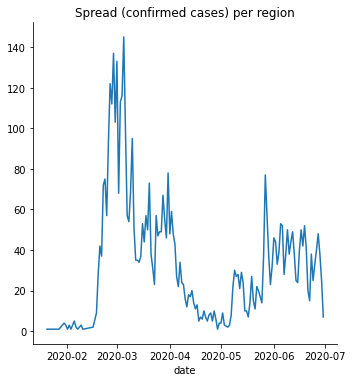

In [ ]:

PatientInfo['date']=pd.to_datetime(PatientInfo.confirmed_date)
df=PatientInfo.groupby('date').count().confirmed_date
sns.relplot(x='date',y=df.values,  kind='line', data=df)
plt.title('Spread (confirmed cases) per region');

In [ ]:
PatientInfo.dropna(subset=['contact_number'],inplace=True)
PatientInfo['contact_number']=PatientInfo['contact_number'].replace('-',0).astype(int)
PatientInfo[PatientInfo['contact_number']>100000079]

,patient_id,sex,age,country,province,city,infection_case,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,date
818,1000000819,NaN,NaN,Korea,Seoul,Eunpyeong-gu,NaN,NaN,1000000796,NaN,2020-05-27,NaN,NaN,released,2020-05-27
5109,6100000097,female,60s,Korea,Gyeongsangnam-do,Jinju-si,etc,NaN,6100000098,2020-03-26,2020-03-31,NaN,NaN,released,2020-03-31
5110,6100000098,male,60s,Korea,Gyeongsangnam-do,Jinju-si,etc,6100000097,6100000099,2020-03-28,2020-03-31,NaN,NaN,released,2020-03-31


# **Topic 2**: Visualizations

##**Basic charts** 

Number of cases per age and sex

In [ ]:
PatientInfo = PatientInfo.dropna(subset = ['sex','age','confirmed_date'])

In [ ]:
# with altair
alt.Chart(PatientInfo).mark_bar().encode(
    x=alt.X('sex:N', axis=None),
    y=alt.Y('count(confirmed_date):Q'),
    color=alt.Color('sex'),
    column=alt.Column('age:N', title = None),
    tooltip=['sex:N', 'age:O', alt.Tooltip('count(confirmed_date):Q')]
).configure_view(
    stroke='transparent'
)

alt.Chart(...)

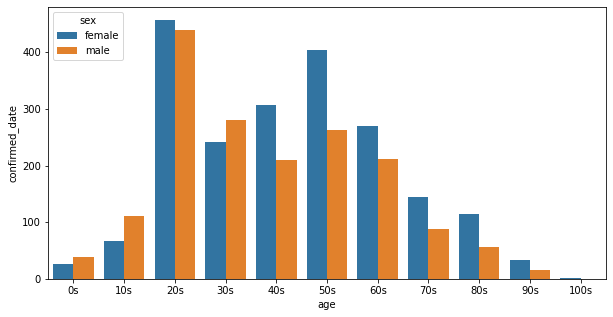

In [ ]:
# with seaborn
df_age = PatientInfo.groupby(['age', 'sex']).count().reset_index()


fig, ax = plt.subplots(figsize=(10, 5))

sns.barplot(x='age', y='confirmed_date', hue='sex', data=df_age, ax=ax, order=['0s', '10s', '20s', '30s', '40s', '50s', '60s', '70s',
       '80s', '90s', '100s']);

Number of cases per region

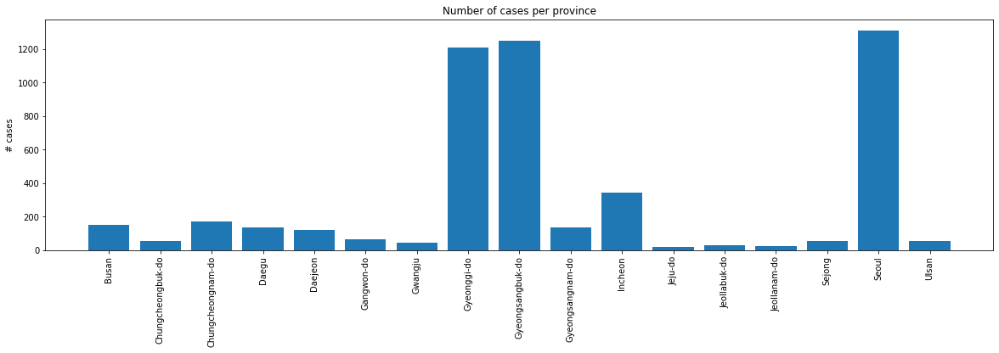

In [ ]:
# using the PatientInfo DF
PatientInfo.groupby('province').count()
# Region.groupby('province').sum()
df_province = PatientInfo.groupby('province')[['confirmed_date']].apply(lambda x: x.count())  # same: PatientInfo.groupby('province').agg({'province': len})

plt.figure(figsize = (20,5))

plt.bar(x=df_province.index, height='confirmed_date', data=df_province)
plt.xticks(rotation=90)
plt.xlabel(None)
plt.ylabel('# cases')
plt.title('Number of cases per province')
plt.show()

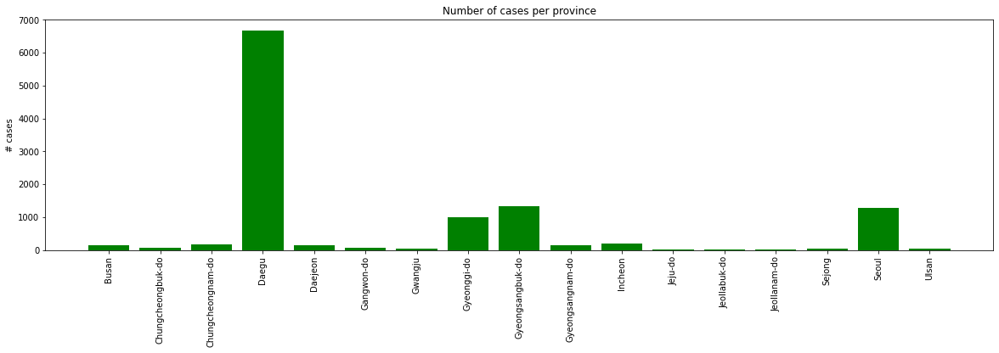

In [ ]:
# using the Case DF
df_province = Case.groupby('province').sum()['confirmed']

plt.figure(figsize = (20,5))

plt.bar(x=df_province.index, height=df_province, data=df_province, color='g')
plt.xticks(rotation=90)
plt.xlabel(None)
plt.ylabel('# cases')
plt.title('Number of cases per province')
plt.show()

## **Advanced charts**

In [ ]:
### get rid of '-'

Case.latitude[Case.latitude=='-']=np.NaN
Case.longitude[Case.longitude=='-']=np.NaN

# Case.latitude.fillna(method='ffill', inplace=True)
# Case.longitude.fillna(method='ffill', inplace=True)
Case.dropna(subset=['latitude','longitude'], inplace=True)

Case.head()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
1,1000002,Seoul,Gwanak-gu,True,Richway,119,37.48208,126.901384
2,1000003,Seoul,Guro-gu,True,Guro-gu Call Center,95,37.508163,126.884387
3,1000004,Seoul,Yangcheon-gu,True,Yangcheon Table Tennis Club,43,37.546061,126.874209
4,1000005,Seoul,Dobong-gu,True,Day Care Center,43,37.679422,127.044374


In [ ]:
### replicate the columns based on the number of confirmed cases for the case_id

# get a copy of Case
df_new = Case.copy()
# reset the index
df_new.reset_index(inplace=True, drop=True)

# replicate using double nested list comprehension
Case_rep = pd.DataFrame([df_new.iloc[idx] 
                       for idx in df_new.index 
                       for _ in range(df_new.iloc[idx]['confirmed'])]).reset_index(drop=True)

In [ ]:
Case_rep

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
1,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
2,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
3,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
4,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
...,...,...,...,...,...,...,...,...
11390,7000003,Jeju-do,-,False,etc,4,-,-
11391,7000003,Jeju-do,-,False,etc,4,-,-
11392,7000003,Jeju-do,-,False,etc,4,-,-
11393,7000003,Jeju-do,-,False,etc,4,-,-


In [ ]:
# pip install --upgrade folium

In [ ]:
# initialize map
m = folium.Map([35.9078, 127.7669], zoom_start=7)

In [ ]:

# mark each station as a point
for index, row in Case_rep.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=2,
                        popup=row['infection_case']
                       ).add_to(m)

stationArr = np.array(Case_rep.dropna()[['latitude', 'longitude']])
m.add_child(plugins.HeatMap(stationArr, radius=50))


# **Topic 3:**  Correlation

## Correlation between SearchTrend and Number of cases using PatientInfo DF

In [ ]:
SearchTrend.head()
Case

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652
1,1000002,Seoul,Gwanak-gu,True,Richway,119,37.48208,126.901384
2,1000003,Seoul,Guro-gu,True,Guro-gu Call Center,95,37.508163,126.884387
3,1000004,Seoul,Yangcheon-gu,True,Yangcheon Table Tennis Club,43,37.546061,126.874209
4,1000005,Seoul,Dobong-gu,True,Day Care Center,43,37.679422,127.044374
...,...,...,...,...,...,...,...,...
169,6100012,Gyeongsangnam-do,-,False,etc,20,-,-
170,7000001,Jeju-do,-,False,overseas inflow,14,-,-
171,7000002,Jeju-do,-,False,contact with patient,0,-,-
172,7000003,Jeju-do,-,False,etc,4,-,-


In [ ]:
#PatientInfo.sort_values(by='confirmed_date')
#df=PatientInfo.groupby('confirmed_date').count()['patient_id'].rename('number_cases')
SearchTrend.merge(Time, left_on='date', right_on='date').corr()

,cold,flu,pneumonia,coronavirus,time,test,negative,confirmed,released,deceased
cold,1.000000,0.441977,0.364537,0.659760,0.527098,-0.570615,-0.572138,-0.587739,-0.633698,-0.633644
flu,0.441977,1.000000,0.867869,0.658271,0.732311,-0.615579,-0.607776,-0.751516,-0.624574,-0.672313
pneumonia,0.364537,0.867869,1.000000,0.643193,0.674531,-0.537473,-0.529533,-0.679876,-0.545281,-0.593277
coronavirus,0.659760,0.658271,0.643193,1.000000,0.764967,-0.716491,-0.716447,-0.809950,-0.759511,-0.789967
time,0.527098,0.732311,0.674531,0.764967,1.000000,-0.723068,-0.714186,-0.944751,-0.727623,-0.801364
test,-0.570615,-0.615579,-0.537473,-0.716491,-0.723068,1.000000,0.999765,0.880901,0.948166,0.939596
negative,-0.572138,-0.607776,-0.529533,-0.716447,-0.714186,0.999765,1.000000,0.875016,0.949233,0.938948
confirmed,-0.587739,-0.751516,-0.679876,-0.809950,-0.944751,0.880901,0.875016,1.000000,0.891721,0.938122
released,-0.633698,-0.624574,-0.545281,-0.759511,-0.727623,0.948166,0.949233,0.891721,1.000000,0.991683
deceased,-0.633644,-0.672313,-0.593277,-0.789967,-0.801364,0.939596,0.938948,0.938122,0.991683,1.000000


## Correlation between confirmed cases and the age of the patient using PatientInfo DF

In [ ]:
df=PatientInfo.groupby(['age']).count()['patient_id'].rename('number_cases').reset_index()
df['age_int']=df['age'].str.extract('(\d+)').astype(int)
df.sort_values('age_int',inplace=True)
df.set_index('age',inplace=True)
df.corr()

,number_cases,age_int
number_cases,1.00000,-0.37794
age_int,-0.37794,1.00000


## Correlation between deceased patients and the age of the patient using PatientInfo DF



In [ ]:
df = PatientInfo[PatientInfo.state=='deceased'].groupby(['age']).count()['deceased_date'].rename('number_deceased').reset_index()
df['age_int']=df['age'].str.extract('(\d+)').astype(int)
df.sort_values('age_int',inplace=True)
df.set_index('age',inplace=True)
df.corr()
# df.plot.scatter(x='age_int',y='number_deceased')

,number_deceased,age_int
number_deceased,1.000000,0.647276
age_int,0.647276,1.000000


,confirmed,deceased,age_int
confirmed,1.000000,-0.372595,-0.033410
deceased,-0.372595,1.000000,0.837302
age_int,-0.033410,0.837302,1.000000


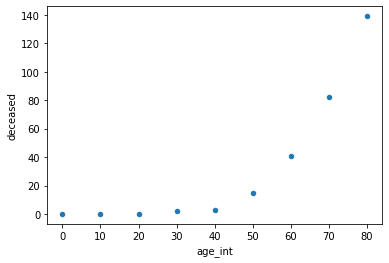

In [ ]:
df = TimeAge.groupby(['age']).max()[['confirmed','deceased']].reset_index()
df['age_int']=df['age'].str.extract('(\d+)').astype(int)
df.sort_values('age_int',inplace=True)
df.set_index('age',inplace=True)
display(df.corr())
df.plot.scatter(x='age_int',y='deceased');

In [ ]:
# I found some discrepancy between the PatientInfo data and the Time Series data:

display(len(PatientInfo[PatientInfo.state=='deceased'].sort_values('confirmed_date')))
display(Time.deceased.max())
display(TimeProvince.groupby('province').max().deceased.sum())
TimeAge.groupby('age').max().deceased.sum()

78

282

283

282

## Correlation between deceased patients and the Weather conditions in the given time frame



In [ ]:
PatientInfo.sort_values(by='confirmed_date')
df=PatientInfo.groupby('confirmed_date').count()['patient_id'].rename('number_cases')
corr=Weather.groupby('date').mean().drop('code', axis=1).merge(df, left_index=True, right_on='confirmed_date').corr()
corr

,avg_temp,min_temp,max_temp,precipitation,max_wind_speed,most_wind_direction,avg_relative_humidity,number_cases
avg_temp,1.000000,0.981081,0.986753,0.307382,-0.296318,-0.214416,0.427364,-0.112267
min_temp,0.981081,1.000000,0.940994,0.347926,-0.281346,-0.212449,0.541085,-0.105933
max_temp,0.986753,0.940994,1.000000,0.262985,-0.299518,-0.197537,0.324397,-0.122449
precipitation,0.307382,0.347926,0.262985,1.000000,-0.011176,-0.139182,0.311218,-0.015609
max_wind_speed,-0.296318,-0.281346,-0.299518,-0.011176,1.000000,0.431725,-0.332120,-0.108325
most_wind_direction,-0.214416,-0.212449,-0.197537,-0.139182,0.431725,1.000000,-0.421551,-0.092404
avg_relative_humidity,0.427364,0.541085,0.324397,0.311218,-0.332120,-0.421551,1.000000,0.073140
number_cases,-0.112267,-0.105933,-0.122449,-0.015609,-0.108325,-0.092404,0.073140,1.000000


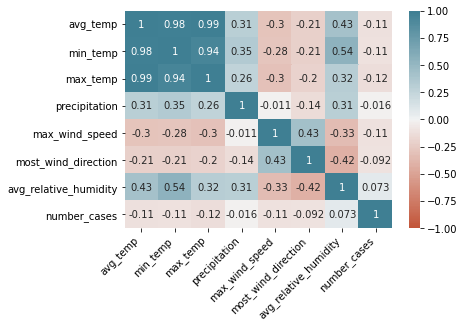

In [ ]:
# correlation heatmap

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    annot=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

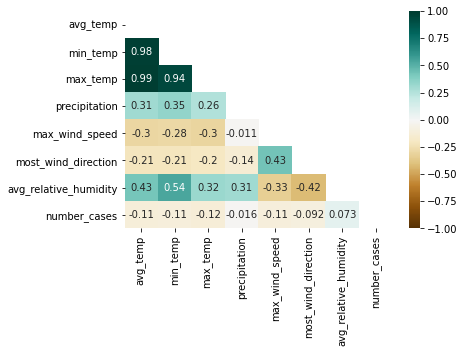

In [ ]:
mask = np.triu(np.ones_like(corr, dtype=np.bool))
heatmap = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')


## Correlation between confirmed cases per province (Case DF) and statistical data of the regions in South Korea



In [ ]:
# region df total (without the districts -> set column province = column state)
df_region_total = Region.query('province==city')[['province','elementary_school_count','kindergarten_count','university_count','academy_ratio','elderly_population_ratio','elderly_alone_ratio','nursing_home_count']]
case_prov = Case.groupby('province').sum().drop(['group',' case_id'], axis=1)
Case[Case.infection_case=='Richway']

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
1,1000002,Seoul,Gwanak-gu,True,Richway,119,37.48208,126.901384
93,2000004,Gyeonggi-do,from other city,True,Richway,58,-,-
115,3000004,Gangwon-do,from other city,True,Richway,4,-,-
130,4100004,Chungcheongnam-do,from other city,True,Richway,3,-,-


In [ ]:
df_region_total.merge(case_prov, left_on = 'province', right_index=True).corr()

,elementary_school_count,kindergarten_count,university_count,academy_ratio,elderly_population_ratio,elderly_alone_ratio,nursing_home_count,confirmed
elementary_school_count,1.000000,0.981118,0.915748,-0.193474,0.153570,0.115468,0.794112,0.061477
kindergarten_count,0.981118,1.000000,0.893019,-0.128199,0.006884,-0.017767,0.786111,0.089833
university_count,0.915748,0.893019,1.000000,-0.214392,0.160519,0.070178,0.885809,0.073136
academy_ratio,-0.193474,-0.128199,-0.214392,1.000000,-0.326156,-0.214889,-0.188696,-0.089583
elderly_population_ratio,0.153570,0.006884,0.160519,-0.326156,1.000000,0.967433,-0.104574,-0.016418
elderly_alone_ratio,0.115468,-0.017767,0.070178,-0.214889,0.967433,1.000000,-0.220500,-0.042478
nursing_home_count,0.794112,0.786111,0.885809,-0.188696,-0.104574,-0.220500,1.000000,0.188264
confirmed,0.061477,0.089833,0.073136,-0.089583,-0.016418,-0.042478,0.188264,1.000000


# **Topic 4:** example of split-apply-combine

In [ ]:
# which person infected most other people
PatientInfo.groupby('infected_by').count().sort_values('patient_id', ascending = False).patient_id

infected_by
2000000205    51
4100000008    27
2000000167    24
1400000209    24
2000000309    21
              ..
1400000321     1
1400000302     1
1400000301     1
1400000299     1
7000000009     1
Name: patient_id, Length: 606, dtype: int64

# **Topic 5:** 

In [ ]:
### check for columns with a lot of unnecessary/repetitive information or NaNs in a column (> 95%). (taken over from your friend)

def unnec_col_check(data, threshold):
  # input: table/dataframe
  # output: columns with unnecessary/repetitive information + percentage of that value

  l=len(data.index)
  low_info_col=[]

  for col in data.columns:
    valcount_col=data[col].value_counts(dropna=False)
    top_valcount_pct=(valcount_col/l).iloc[0]

    if top_valcount_pct > threshold:
      low_info_col.append(col)
      print(f'{col}: {top_valcount_pct:.5f}%')


In [ ]:
unnec_col_check(PatientInfo, 0.7)


country: 0.99187%
infected_by: 0.73940%
contact_number: 0.84685%
symptom_onset_date: 0.86641%
deceased_date: 0.98722%


In [ ]:
# pip install --upgrade ProfileReport

In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]